<a href="https://colab.research.google.com/github/sridevibonthu/EVA/blob/master/S15/Final_Model_with_all_data_L1%2C_SSIM%2C_128X128_10_epochs_with_augmentions_good.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Import Libraries

In [0]:
!git clone https://github.com/sridevibonthu/EVALibrary.git
import sys
sys.path.append("/content/EVALibrary/EVA4")

fatal: destination path 'EVALibrary' already exists and is not an empty directory.


In [0]:
import warnings
warnings.filterwarnings("ignore")
import random
from tqdm.notebook import tqdm, trange
import os
import gc
from torch.utils.tensorboard import SummaryWriter
from torch.utils.data import Dataset, DataLoader
from PIL import Image
from torchvision.transforms import transforms
from matplotlib import pyplot as plt
import torchvision
import torch
from torch import nn
from utils import prepareData, displayData, show
from CowData import CowDataset 

In [0]:
!pip install torchsummary
from torchsummary import summary

In [0]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

In [0]:
#Create directory of logs
logs_base_dir = "runs"
os.makedirs(logs_base_dir, exist_ok=True)

### Copying data to localspace, unizipping them and removing the zip file

In [0]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


## Data Preparation
### 1. Load the data from Google Drive to Colab and unzipping
* data folder contains background images, out folder which has 400K images of each fgbg, mask and depth
* plots folder is used to store intermediate results generated from training (move to drive at the end)

In [0]:
%%time
!mkdir data
!mkdir plots
!cp -r /content/drive/'My Drive'/EVA4/data/bgimages ./data/bgimages/

from zipfile import ZipFile
with ZipFile('/content/drive/My Drive/EVA4/data/fbbgmaskdepth.zip', mode='r') as input:
  input.extractall('./data')

CPU times: user 2min 18s, sys: 1min 9s, total: 3min 27s
Wall time: 4min 35s


### 2. Preparing Dataset from the folder structure we have
* prepareData method takes data folder and creates 400K records.
* Every record contains path of background image, fgbg image, mask image, depth image.
* data[i] contains ith record of dataset as a tuple of paths
* displayData method prints the images by using the paths present in the dataset.


In [0]:
data = prepareData('./data')

In [0]:
#data = data[:5000]   #for testing everything is running or not
print('Dataset size :',len(data))
trainlen = int(len(data)*0.7)
print("Train set : ", trainlen)
print("Test set : ", len(data)-trainlen)
print("Sample Record in the data set.... Contains paths to bg, fgbg, mask and depth")
print(data[0])
#print(data[399999])

Dataset size : 400000
Train set :  280000
Test set :  120000
Sample Record in the data set.... Contains paths to bg, fgbg, mask and depth
('./data/bgimages/bgimg099.jpg', './data/out2/images/fgbg392483.jpg', './data/out2/masks/mask392483.jpg', './data/out2/depth/fgbg392483.jpg')


(160, 160) (160, 160) (160, 160) (160, 160)


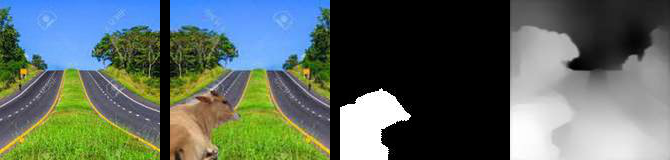

In [0]:
#Samplerecord display
displayData(data, 299)

### 3. Data Loading
* Channel means and standard deviations are calculated already. Source : https://github.com/sridevibonthu/EVA/blob/master/S14/Data_Statistics.ipynb
* Various transformations tried.
* A class CowDataset is built for loading custom dataset  Source : Github link
* Train and test datasets were created with their respective transforms.
* Dataloader objects were created with the names train_loader, test_loader


In [0]:
import numpy as np
from eva4datatransforms import AlbumentationTransforms
import albumentations as A

#bg images : 
bgmean = (0.50975785, 0.53840251, 0.52615038) 
bgstd = (0.24804363, 0.24685429, 0.2873205 ) 

#fgbg_images : 
fgbgmean = (0.51219183, 0.5250236, 0.50610699)
fgbgstd = (0.24747186, 0.24801724, 0.28525343)

#mask_images :
maskmean = (0.13532567,)
maskstd =  (0.33999708,)

#depth_images : 
depthmean = (0.57016144, )
depthstd =  (0.25914387,)

bg_transforms = transforms.Compose([
         transforms.Resize((128,128)),
         #transforms.RandomHorizontalFlip(),   #should not do
         #transforms.RandomRotation(-15, 15),
         transforms.RandomGrayscale(),
         transforms.ToTensor(),
         transforms.Normalize(bgmean, bgstd)                              
])

fgbg_transforms = transforms.Compose([
         transforms.Resize((128,128)),
         #transforms.RandomHorizontalFlip(),
         transforms.RandomRotation((-4, 4)),
         transforms.RandomGrayscale(p=0.05),
         transforms.ColorJitter(brightness=0.15, contrast=0.08, saturation=0.08, hue=0.08),
         transforms.ToTensor(),
         transforms.Normalize(fgbgmean, fgbgstd)                              
])
test_bgtransforms = transforms.Compose([
         transforms.Resize((128,128)),
         transforms.ToTensor(),
         transforms.Normalize(bgmean, bgstd)                              
])

test_fgbgtransforms = transforms.Compose([
         transforms.Resize((128,128)),
         transforms.ToTensor(),
         transforms.Normalize(fgbgmean, fgbgstd)                              
])

mask_transforms = transforms.Compose([
         transforms.Resize((128, 128)),
         transforms.ToTensor(),
         #transforms.Normalize(maskmean, maskstd)                              
])

depth_transforms = transforms.Compose([
         transforms.Resize((128, 128)),
         transforms.ToTensor(),
         #transforms.Normalize(depthmean, depthstd)                              
])


In [0]:
train = CowDataset(data[:trainlen],  bg_transforms, fgbg_transforms, mask_transforms, depth_transforms)
test = CowDataset(data[trainlen:], test_bgtransforms, test_fgbgtransforms, mask_transforms, depth_transforms)
print(len(train), len(test))

280000 120000


In [0]:
import eva4dataloaders
batch_size=64

dataloader = eva4dataloaders.DataLoader(batch_size=batch_size, shuffle=True)

# train dataloader
train_loader = dataloader.load(train)

# test dataloader
test_loader = dataloader.load(test)

## Data Statistics

In [0]:
[(k, v.shape) for k, v in train[0].items()]

[('bg', torch.Size([3, 128, 128])),
 ('fgbg', torch.Size([3, 128, 128])),
 ('mask', torch.Size([1, 128, 128])),
 ('depth', torch.Size([1, 128, 128]))]

In [0]:
sample = next(iter(train_loader))
totalbatches = len(train_loader)
print('No.of batches :', totalbatches, 'Every sample contains :', len(sample))

No.of batches : 4375 Every sample contains : 4


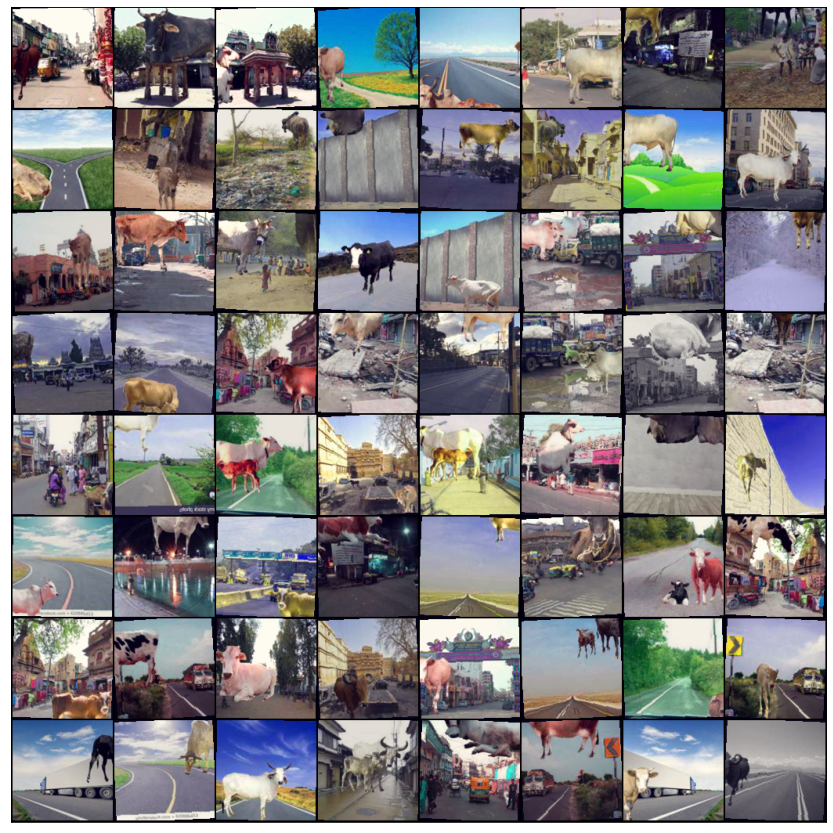

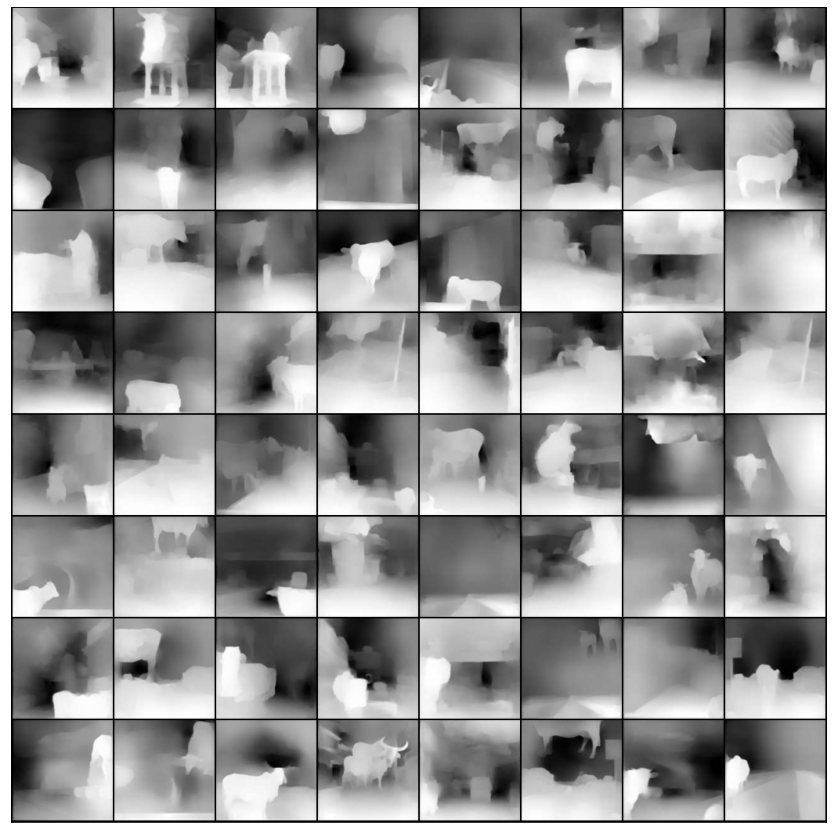

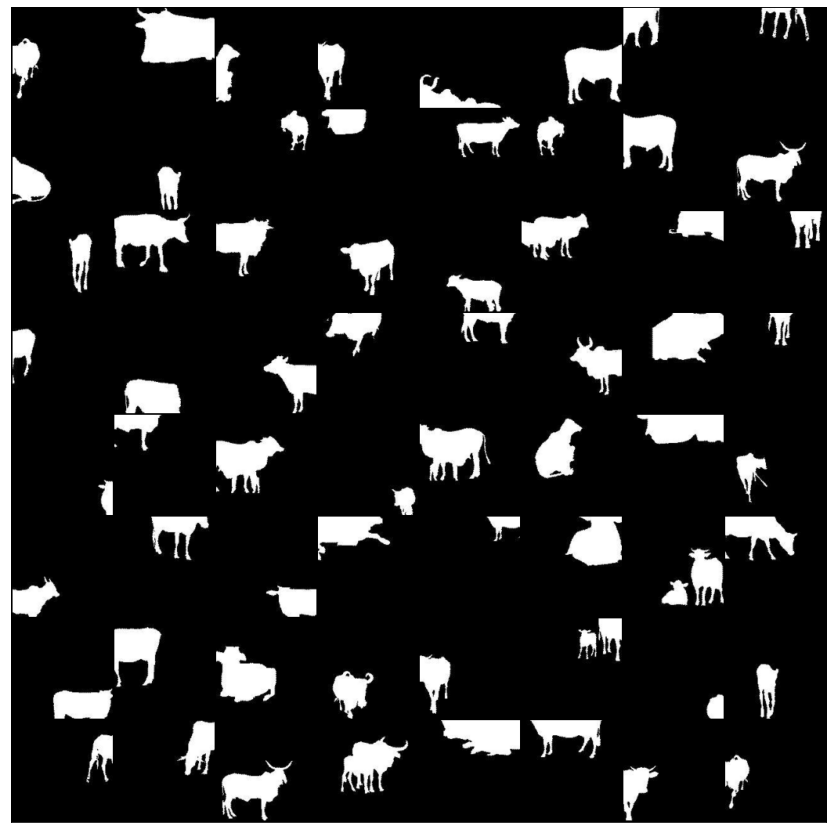

In [0]:
show(sample['fgbg'], normalize=True)
show(sample['depth'])
show(sample['mask'])

### 4. Model Creation
* Followd Encoder - Decoder Architecture

In [0]:
#from eva4models.eva4resnet import ResNet18
from loss import ssim
from lightmodel import S15Model
model = S15Model("LightModel")
use_cuda = torch.cuda.is_available()
model.device = torch.device("cuda" if use_cuda else "cpu")
model.to(model.device)
model.summary(input_size=([(3,128,128),(3,128,128)]))

Model parameters initialized
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 32, 128, 128]           1,728
       BatchNorm2d-2         [-1, 32, 128, 128]              64
              ReLU-3         [-1, 32, 128, 128]               0
            Conv2d-4           [-1, 64, 64, 64]          18,432
       BatchNorm2d-5           [-1, 64, 64, 64]             128
              ReLU-6           [-1, 64, 64, 64]               0
            Conv2d-7           [-1, 64, 64, 64]           4,096
       BatchNorm2d-8           [-1, 64, 64, 64]             128
              ReLU-9           [-1, 64, 64, 64]               0
           Conv2d-10           [-1, 64, 64, 64]             576
      BatchNorm2d-11           [-1, 64, 64, 64]             128
             ReLU-12           [-1, 64, 64, 64]               0
           Conv2d-13           [-1, 64, 64, 64]           4,096
      Batc

Initial LR-  [0.009999999999999995]
Total steps -  43760
No.of steps to increase LR - 13127.0
No.of steps to reduce LR -  30632.0


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



First batch in testing fgbg, (mask, predicted mask), (depth, predicted depth)


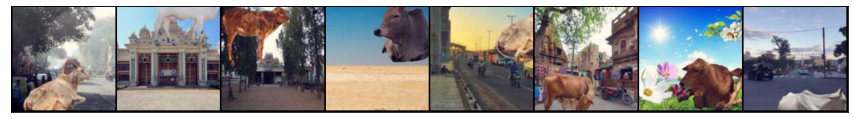

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


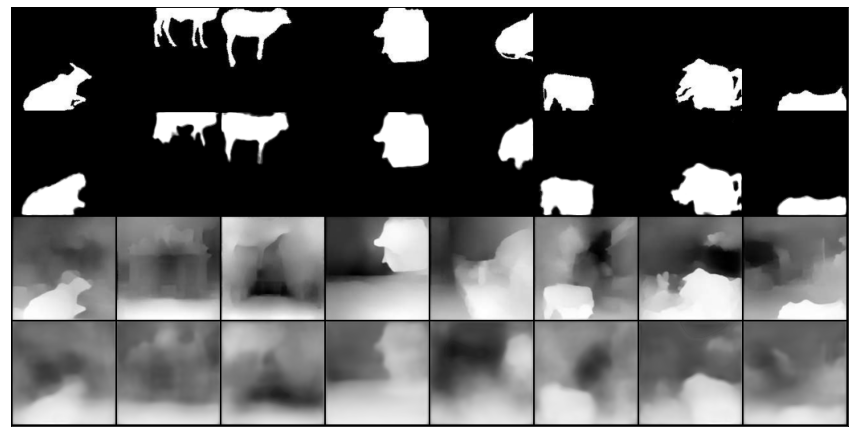

Validation loss decreased (100000.000000 --> 0.047814).  Saving model ...
Epoch: 1, Train set: Average loss: 0.1747 ; Test set: Average loss: 0.0478
Learning Rate = 0.032494


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



First batch in testing fgbg, (mask, predicted mask), (depth, predicted depth)


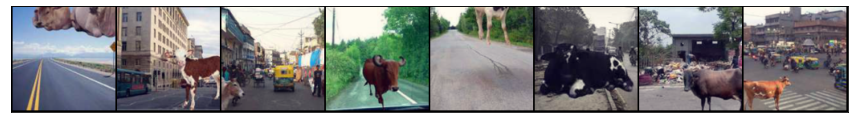

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


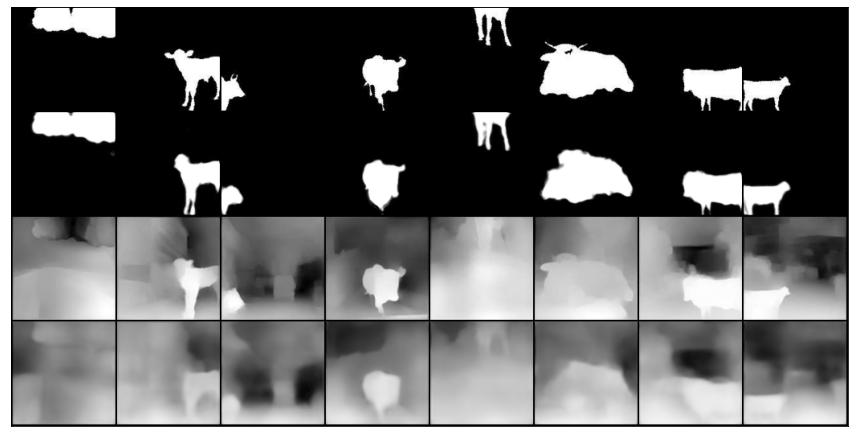

Validation loss decreased (0.047814 --> 0.037817).  Saving model ...
Epoch: 2, Train set: Average loss: 0.1491 ; Test set: Average loss: 0.0378
Learning Rate = 0.077488


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



First batch in testing fgbg, (mask, predicted mask), (depth, predicted depth)


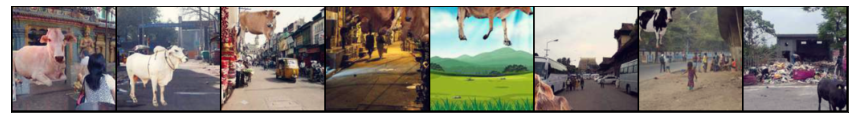

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


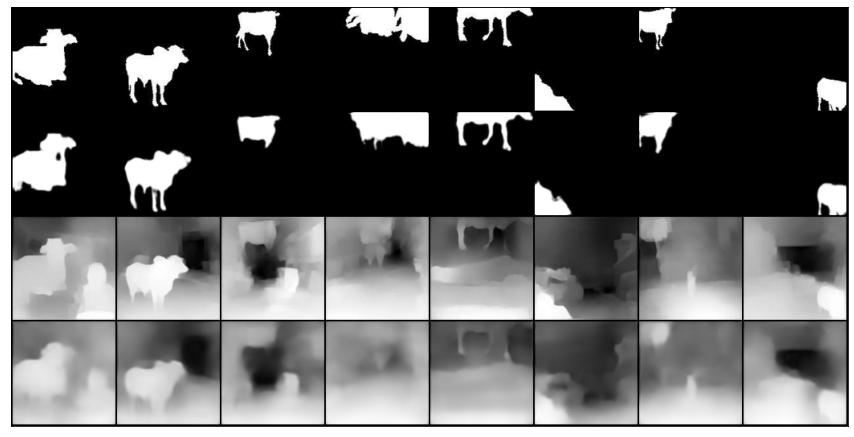

Validation loss decreased (0.037817 --> 0.036061).  Saving model ...
Epoch: 3, Train set: Average loss: 0.1431 ; Test set: Average loss: 0.0361
Learning Rate = 0.100000


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



First batch in testing fgbg, (mask, predicted mask), (depth, predicted depth)


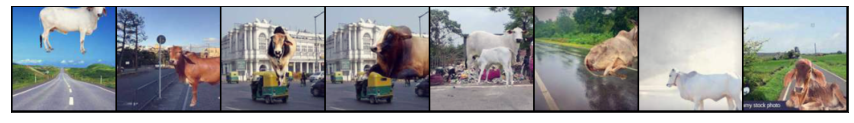

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


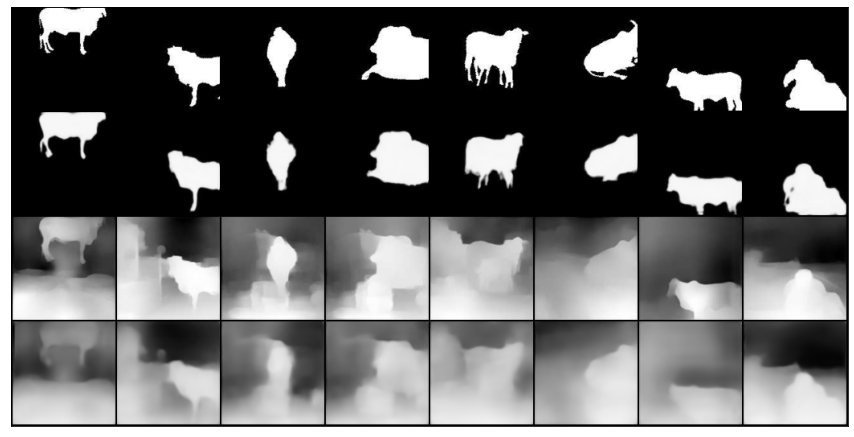

Validation loss decreased (0.036061 --> 0.029740).  Saving model ...
Epoch: 4, Train set: Average loss: 0.1398 ; Test set: Average loss: 0.0297
Learning Rate = 0.095055


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



First batch in testing fgbg, (mask, predicted mask), (depth, predicted depth)


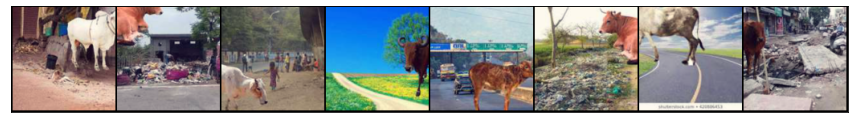

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


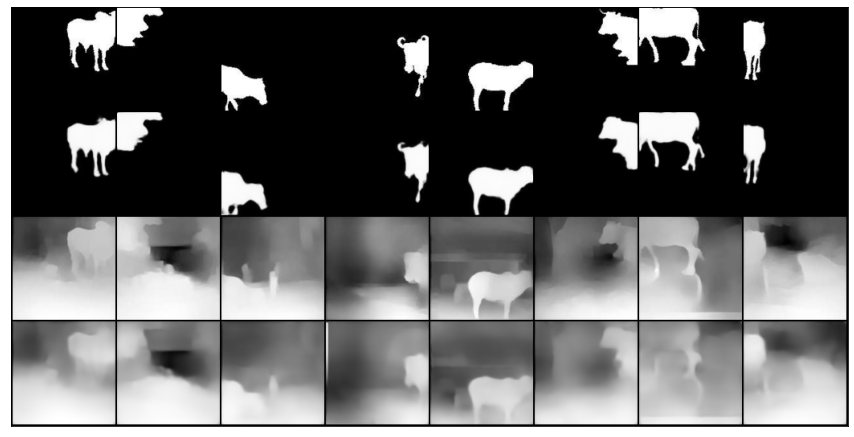

Validation loss decreased (0.029740 --> 0.029215).  Saving model ...
Epoch: 5, Train set: Average loss: 0.1366 ; Test set: Average loss: 0.0292
Learning Rate = 0.081191


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



First batch in testing fgbg, (mask, predicted mask), (depth, predicted depth)


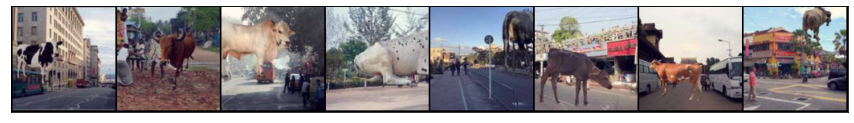

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


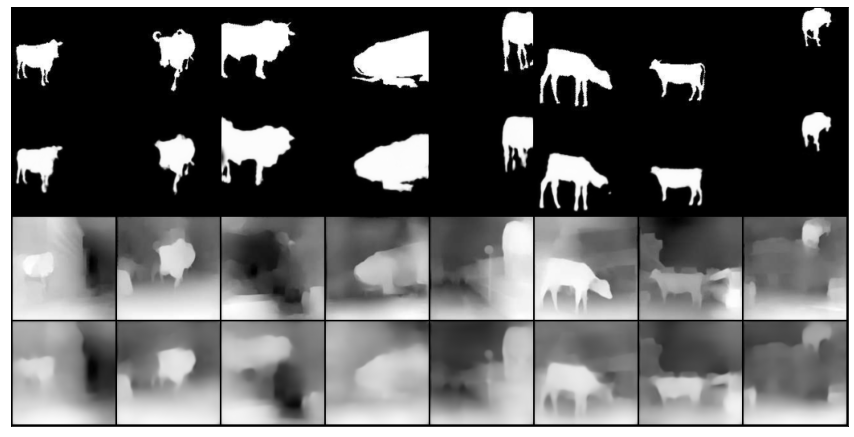

Validation loss decreased (0.029215 --> 0.027716).  Saving model ...
Epoch: 6, Train set: Average loss: 0.1352 ; Test set: Average loss: 0.0277
Learning Rate = 0.061151


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



First batch in testing fgbg, (mask, predicted mask), (depth, predicted depth)


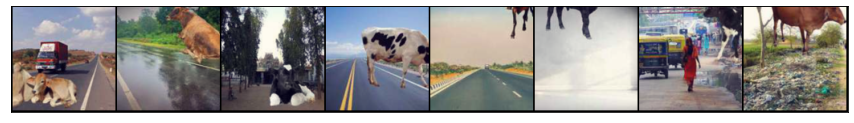

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


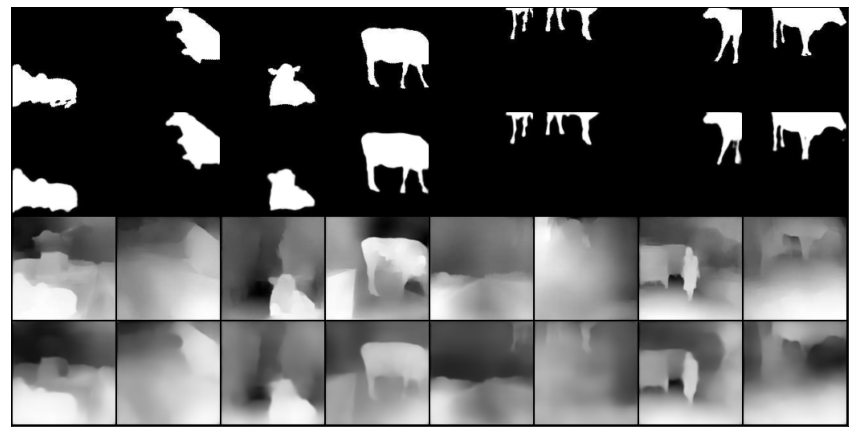

Validation loss decreased (0.027716 --> 0.026740).  Saving model ...
Epoch: 7, Train set: Average loss: 0.1349 ; Test set: Average loss: 0.0267
Learning Rate = 0.038905


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



First batch in testing fgbg, (mask, predicted mask), (depth, predicted depth)


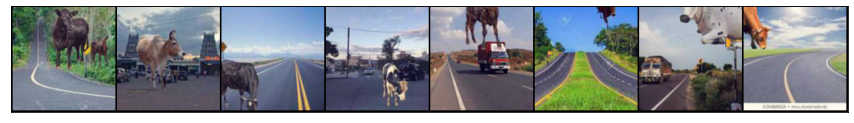

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


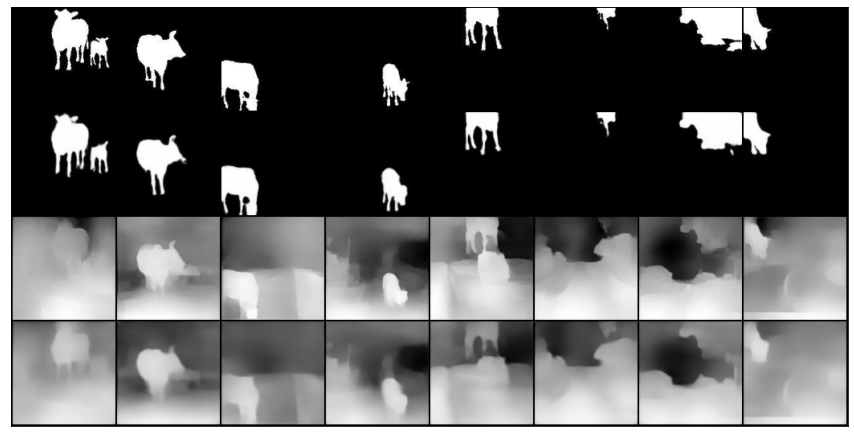

Validation loss decreased (0.026740 --> 0.026025).  Saving model ...
Epoch: 8, Train set: Average loss: 0.1349 ; Test set: Average loss: 0.0260
Learning Rate = 0.018854


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



First batch in testing fgbg, (mask, predicted mask), (depth, predicted depth)


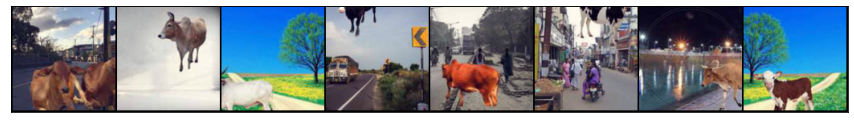

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


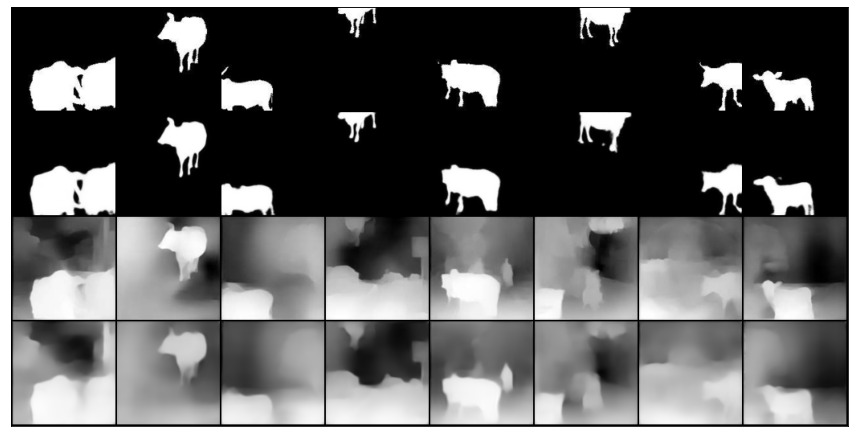

Validation loss decreased (0.026025 --> 0.025464).  Saving model ...
Epoch: 9, Train set: Average loss: 0.1343 ; Test set: Average loss: 0.0255
Learning Rate = 0.004970


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



First batch in testing fgbg, (mask, predicted mask), (depth, predicted depth)


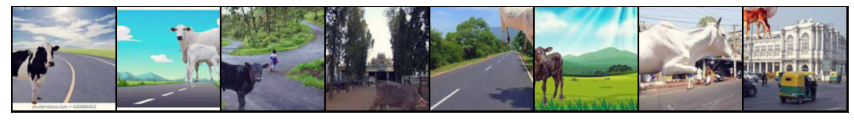

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


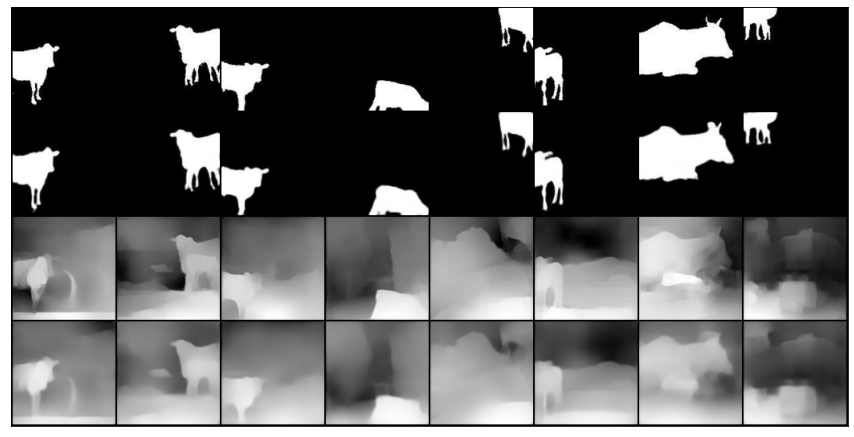

Validation loss decreased (0.025464 --> 0.025234).  Saving model ...
Epoch: 10, Train set: Average loss: 0.1339 ; Test set: Average loss: 0.0252
Learning Rate = 0.000001



In [0]:
c1 = nn.L1Loss()   # combined with SSIM in train class
c2 = nn.L1Loss()   # combine with SSIM in train class
optimizer = torch.optim.SGD(model.parameters(), lr = 0.01, momentum =0.9, nesterov=True, weight_decay = 1e-5 )
#from torch.optim.lr_scheduler import StepLR
device = torch.device('cuda:0')
model = model.to(device)
#scheduler = StepLR(optimizer, step_size=1, gamma=0.01)
L1lambda=0
EPOCHS = 10
#scheduler = StepLR(optimizer, step_size=5, gamma=0.5)
scheduler = torch.optim.lr_scheduler.OneCycleLR(optimizer, max_lr=0.1, steps_per_epoch=int(len(train_loader))+1, epochs=EPOCHS, div_factor=10)
#scheduler = ReduceLROnPlateau(optimizer, min_lr=1e-7, patience = 2)
print("Initial LR- ",scheduler.get_lr())
print("Total steps - ", scheduler.total_steps)
print("No.of steps to increase LR -", scheduler.step_size_up)
print("No.of steps to reduce LR - ", scheduler.step_size_down)
model.gotrain(optimizer, train_loader, test_loader, EPOCHS, "/content/drive/My Drive", scheduler, True, criterion1=c1, criterion2=c2)

### Moving the plots to Google Drive

In [0]:
#copy the plots to drive
!cp -rf ./plots /content/drive/'My Drive'/EVA4/data/plots_sssimL1128128_10epochs_aug
print("Plots copied to drive")

Plots copied to drive


In [0]:

%tensorboard --logdir {logs_base_dir}

<IPython.core.display.Javascript object>

## TEsting the model on unseen data

In [0]:
import numpy
unseen =[]
path = '/content/drive/My Drive/EVA4/data/Example/'
for f in os.listdir(path):
  unseen.append(path+f)
print(unseen)

class TestDataset(Dataset):
  def __init__(self, data, fgbgtransforms):
    self.fgbg_files = data
    self.fgbgtransforms = fgbgtransforms
    
  def __len__(self):
    return len(self.fgbg_files)
    
  def __getitem__(self, index):
    fgbg_image = Image.open(self.fgbg_files[index])
    fgbg_image = self.fgbgtransforms(fgbg_image)
    
    return fgbg_image


['/content/drive/My Drive/EVA4/data/Example/cow1.jpg', '/content/drive/My Drive/EVA4/data/Example/cow3.jpg', '/content/drive/My Drive/EVA4/data/Example/cow4.jpg', '/content/drive/My Drive/EVA4/data/Example/cow5.jpg', '/content/drive/My Drive/EVA4/data/Example/cow2.jpg', '/content/drive/My Drive/EVA4/data/Example/cow6.jpg', '/content/drive/My Drive/EVA4/data/Example/cow7.jpg', '/content/drive/My Drive/EVA4/data/Example/cow8.jpg']


In [0]:
unseen = TestDataset(unseen, fgbg_transforms)
dataloader1 = eva4dataloaders.DataLoader(batch_size=8, shuffle=True)
unseen_loader = dataloader1.load(unseen)
sample = next(iter(unseen_loader))
sample = sample.to(model.device)
mask, depth = model(sample, sample)


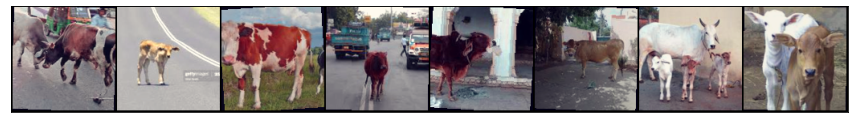

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


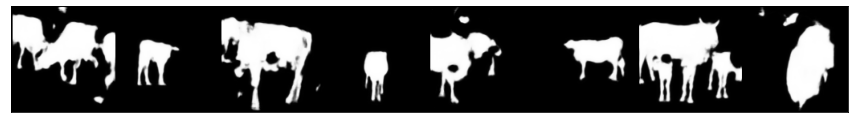

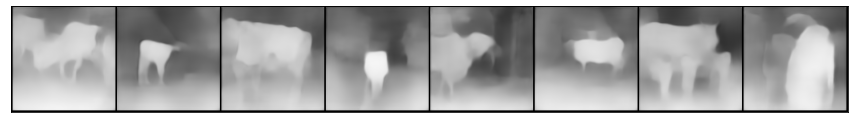

In [0]:
show(sample.detach().cpu(), normalize=True)
show(mask.detach().cpu())
show(depth.detach().cpu())